# Brian's 2025 hackathon 

Learning to use [healPix cookbook](https://projectpythia.org/healpix-cookbook/README.html), uxarray, etc.

Put things here for others: /glade/derecho/scratch/digital-earths-hackathon/notebooks/science_groups/xxx/group_notebooks


---------------

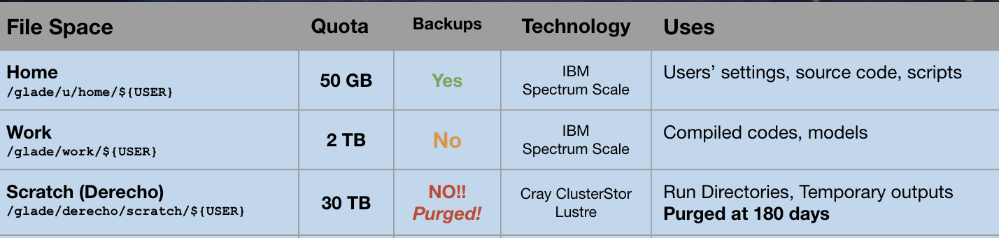

In [2]:
!pwd

/glade/u/home/mapes


In [3]:
# File->Open /derecho/scratch/digital-earths-hackathon/notebooks

!ls /glade/derecho/scratch/digital-earths-hackathon/

alojko	 conus404	   ICON		  mpas_DYAMOND2  notebooks
benkirk  e3sm		   kukulies	  mpas_DYAMOND3  oero
brianpm  ecomip		   mcs_tracking   ncheruku	 samerica
clyne	 glm.n2560_RAL3p3  mpas_DYAMOND1  nicam


In [4]:
!ls /glade/derecho/scratch/digital-earths-hackathon/notebooks/uxarray/

healpix_cookbook
plot_annual_mean_surface_temperature_healpix.ipynb
plot_specific_humidity_healpix.ipynb
plot_terrain_mpas.ipynb


In [5]:
### Import Packages: so many, gathered here 

import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

## HEALPix Specific
import healpy as hp
import healpix
import easygems.healpix as egh
import easygems.remap as egr

import uxarray as ux 

import cartopy.crs as ccrs
import cartopy.feature as cf
import cmocean

# Package for interpolation routine: (Could use XESMF)
from scipy.interpolate import griddata

-------------
# Catalog of hackathon datasets 
--------------

In [6]:
import intake
# catalogue from which node? 
cat = intake.open_catalog("https://digital-earths-global-hackathon.github.io/catalog/catalog.yaml")["NCAR"]

In [7]:
list(cat)
# cat.ERA5.discover()

['ERA5',
 'IR_IMERG',
 'JRA3Q',
 'MERRA2',
 'casesm2_10km_nocumulus',
 'icon_d3hp003',
 'icon_d3hp003aug',
 'icon_d3hp003feb',
 'icon_ngc4008',
 'ifs_tco3999-ng5_deepoff',
 'ifs_tco3999-ng5_rcbmf',
 'ifs_tco3999-ng5_rcbmf_cf',
 'mpas_dyamond1',
 'mpas_dyamond2',
 'mpas_dyamond3',
 'nicam_gl11',
 'scream-dkrz',
 'scream2D_hrly',
 'scream_lnd',
 'scream_ne120',
 'tracking-d3hp003',
 'um_Africa_km4p4_RAL3P3_n1280_GAL9_nest',
 'um_CTC_km4p4_RAL3P3_n1280_GAL9_nest',
 'um_SAmer_km4p4_RAL3P3_n1280_GAL9_nest',
 'um_SEA_km4p4_RAL3P3_n1280_GAL9_nest',
 'um_glm_n1280_CoMA9_TBv1p2',
 'um_glm_n1280_GAL9',
 'um_glm_n2560_RAL3p3',
 'wrf_conus',
 'wrf_samerica']

In [9]:
cat.mpas_dyamond2.discover()

/glade/u/apps/opt/conda/envs/2025-digital-earths-global-hackathon/lib/python3.12/site-packages/intake_xarray/base.py:21: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  'dims': dict(self._ds.dims),


{'dtype': None,
 'shape': None,
 'npartitions': None,
 'metadata': {'creator_name': 'Falko Judt',
  'experiment_id': 'dyamond2',
  'institution': 'NSF National Center for Atmospheric Research',
  'project': 'global_hackathon',
  'simulation_id': 'unknown',
  'source_id': 'MPAS',
  'summary': 'Atmosphere-land simulation at 3.75km grid spacing. Run from 2020-01-20 to 2020-03-01.\n\n**Resolutions**\n  * All data is available at HEALPix levels 1-10 for 2D fields\n\n**Processing**\n  * Fields were remapped to HEALPix level 10 using Delaunay triangulation. \n  * Lower levels were generated from this using coarse-graining.',
  'time_end': datetime.datetime(2020, 3, 1, 0, 0),
  'time_start': datetime.datetime(2020, 1, 20, 0, 0),
  'title': 'NCAR MPAS 3.75km simulation (partial DYAMOND2)',
  'catalog_dir': 'https://digital-earths-global-hackathon.github.io/catalog/NCAR',
  'dims': {'time': 329,
   'cell': 196608,
   'nVertLevels': 55,
   'nSoilLevels': 4,
   'nVertLevelsP1': 56},
  'data_vars':

In [1]:
# Zonal mean ux_hp_zonal for healpix

def ux_hp_zonal(uxda, latname='face_lat'):
    newda = ux.UxDataArray(uxda, uxgrid=uxda.uxgrid, dims=uxda.dims,\
        coords={'lat': ('n_face', uxda.uxgrid[latname].data)})
    zm = newda.groupby('lat').mean()
    zd = newda - zm.sel(lat=newda['lat'])
    return zm, zd

-------------------
# Momentum flux @ tropopause in dyamond data 

In [10]:
ZOOMLEVEL=5  # mpas_dyamond goes up to 10 

ds = cat.mpas_dyamond2(zoom=ZOOMLEVEL).to_dask()
ds

/glade/u/apps/opt/conda/envs/2025-digital-earths-global-hackathon/lib/python3.12/site-packages/intake_xarray/base.py:21: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  'dims': dict(self._ds.dims),


<xarray.Dataset> Size: 6GB
Dimensions:                 (time: 329, cell: 12288, nVertLevels: 55,
                             nSoilLevels: 4, nVertLevelsP1: 56)
Coordinates:
  * cell                    (cell) float64 98kB nan 1.0 ... 1.229e+04 1.229e+04
  * nSoilLevels             (nSoilLevels) float64 32B nan 1.0 2.0 3.0
  * nVertLevels             (nVertLevels) float64 440B nan 1.0 2.0 ... 53.0 54.0
  * nVertLevelsP1           (nVertLevelsP1) float64 448B nan 1.0 ... 54.0 55.0
  * time                    (time) datetime64[ns] 3kB 2020-01-20 ... 2020-03-01
Data variables: (12/19)
    air_temperature         (time, cell, nVertLevels) float32 889MB dask.array<chunksize=(1, 12288, 55), meta=np.ndarray>
    h_oml                   (time, cell) float32 16MB dask.array<chunksize=(1, 12288), meta=np.ndarray>
    hu_oml                  (time, cell) float32 16MB dask.array<chunksize=(1, 12288), meta=np.ndarray>
    hv_oml                  (time, cell) float32 16MB dask.array<chunksize=(1, 12288), meta=np.ndarray>
    pressure                (time, cell, nVertLevels) float32 889MB dask.array<chunksize=(1, 12288, 55), meta=np.ndarray>
    relhum                  (time, cell, nVertLevels) float32 889MB dask.array<chunksize=(1, 12288, 55), meta=np.ndarray>
    ...                      ...
    tslb                    (time, cell, nSoilLevels) float32 65MB dask.array<chunksize=(1, 12288, 4), meta=np.ndarray>
    uReconstructMeridional  (time, cell, nVertLevels) float32 889MB dask.array<chunksize=(1, 12288, 55), meta=np.ndarray>
    uReconstructZonal       (time, cell, nVertLevels) float32 889MB dask.array<chunksize=(1, 12288, 55), meta=np.ndarray>
    vegfra                  (time, cell) float32 16MB dask.array<chunksize=(1, 12288), meta=np.ndarray>
    w                       (time, cell, nVertLevelsP1) float32 906MB dask.array<chunksize=(1, 12288, 56), meta=np.ndarray>
    xice                    (time, cell) float32 16MB dask.array<chunksize=(1, 12288), meta=np.ndarray>

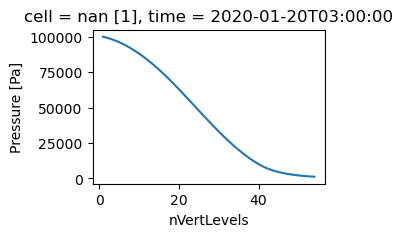

In [84]:
# Find the tropopause! from air_temperature, or pressure 
# At cell 0, time 0, tropopause looks like level 40 or so 

ds['pressure'][1][0].plot(size=2, aspect=1.5);

<Figure size 640x480 with 0 Axes>

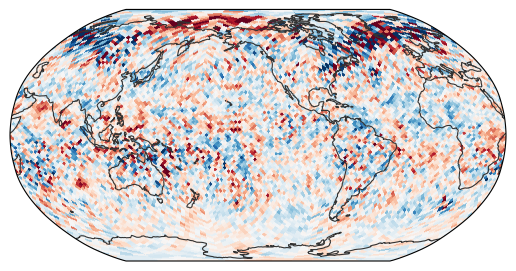

In [145]:
# Quick healpix plot of w at level 40 -- seems too tied to topography
egh.healpix_show(ds['w'][1,:,50], vmin=-0.05, vmax=0.05, cmap='RdBu_r');  #, cbar=True);

In [72]:
# Try uxarray plot instead of easygems, it has a colorbar etc (bokeh) 

import uxarray as ux 
uxds = ux.UxDataset.from_healpix(ds)
uxds.w

<xarray.UxDataArray 'w' (time: 329, n_face: 12288, nVertLevelsP1: 56)> Size: 906MB
dask.array<open_dataset-w, shape=(329, 12288, 56), dtype=float32, chunksize=(1, 12288, 56), chunktype=numpy.ndarray>
Coordinates:
    cell           (n_face) float64 98kB nan 1.0 2.0 ... 1.229e+04 1.229e+04
  * nVertLevelsP1  (nVertLevelsP1) float64 448B nan 1.0 2.0 ... 53.0 54.0 55.0
  * time           (time) datetime64[ns] 3kB 2020-01-20 ... 2020-03-01
Dimensions without coordinates: n_face
Attributes:
    units:                      m s^{-1}
    long_name:                  Vertical velocity at vertical cell faces
    healpix_nside:              32
    healpix_dim_name:           cell
    original_mpas_spatial_dim:  nCells

In [75]:
# Uxarray uses bokeh not matplotlib, more services 
uxds.w[1,:,50].plot(features=["coastline"])

:Overlay
   .Image.I     :Image   [Longitude,Latitude]   (Longitude_Latitude w)
   .Coastline.I :Feature   [Longitude,Latitude]

In [92]:
# Make a uw dataset, just renaming staggered levels
# subset by latitude, and plot with with zonal mean (SLOW in uxarray) 

u = uxds['uReconstructZonal']
w  = uxds['w'][:, :, 0:55].rename({"nVertLevelsP1" : "nVertLevels"})
uw = (u * w)

In [103]:
%%time
uw_eq = uw.cross_section.constant_latitude_interval((-10, 10))

CPU times: user 11.5 ms, sys: 0 ns, total: 11.5 ms
Wall time: 10.4 ms


In [89]:
%%time
uw_za = uw.isel(time=1, nVertLevels=40).zonal_average((-10, 10, 0.5))

CPU times: user 6.9 s, sys: 202 ms, total: 7.1 s
Wall time: 7.14 s


In [138]:
#(uw_eq.isel(time=1, nVertLevels=40).plot(backend='bokeh', ylim=(-10, 10), colorbar=False, features=["coastline"]) + uw_za.plot.line(x="zonal_mean", y="latitudes", ylim=(-10, 10), width=250)).opts()
(uw_eq.isel(time=1, nVertLevels=40).plot(backend='bokeh', ylim=(-10, 10), colorbar=False) + uw_za.plot.line(x="zonal_mean", y="latitudes", ylim=(-10, 10), width=250)).opts()

:Layout
   .Image.I :Image   [x,y]   (x_y var)
   .Curve.I :Curve   [zonal_mean]   (latitudes)

In [124]:
# Simple average over all the faces in this latitude belt 
uwtot = uw_eq.mean(dim='n_face')
uwtot

<xarray.UxDataArray (time: 329, nVertLevels: 55)> Size: 72kB
dask.array<mean_agg-aggregate, shape=(329, 55), dtype=float32, chunksize=(1, 55), chunktype=numpy.ndarray>
Coordinates:
  * nVertLevels  (nVertLevels) float64 440B nan 1.0 2.0 3.0 ... 52.0 53.0 54.0
  * time         (time) datetime64[ns] 3kB 2020-01-20 ... 2020-03-01

In [128]:
import hvplot.xarray

In [136]:
%%time
uwtot = uwtot.to_xarray().compute()

CPU times: user 2min 30s, sys: 37.9 s, total: 3min 8s
Wall time: 24.6 s


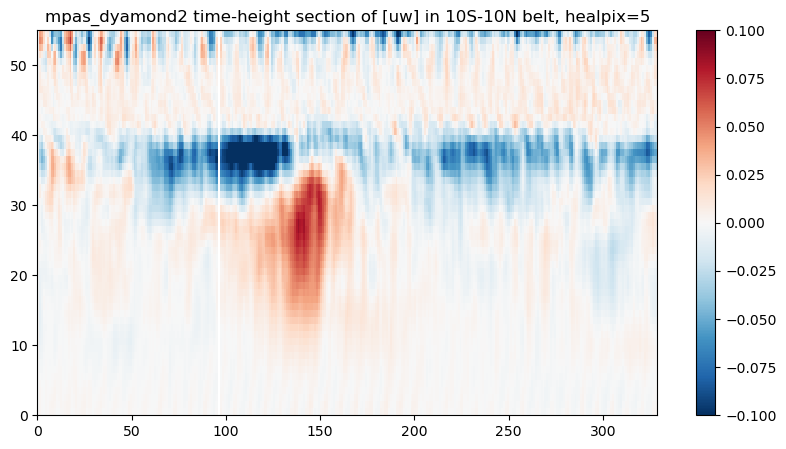

In [139]:
plt.figure(figsize=(10,5))
plt.pcolormesh( uwtot.transpose(), vmin=-0.1,vmax=0.1,cmap='RdBu_r' ); plt.colorbar();
plt.title('mpas_dyamond2 time-height section of [uw] in 10S-10N belt, healpix=' + str(ZOOMLEVEL) );